# Basic AequilibraE use

In this example, we grab a pre-existing model and do the following:

* Add new fields to the network
* Re-compute fields in the network
* Visualize the network
* Perform Skimming
* Perform Assignment


## Running on Google Colab

Press here to open this notebook in Google Colab <a href="https://colab.research.google.com/github/outerl/AequilibraE-demo/blob/main/basic_aequilibrae_demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open in Colab"/></a>

Once in Colab, uncomment the cell below and run it.

**It will restart your Python environment to load all packages correctly**, so it is not possible just run all cells

In [1]:
# !apt-get update && apt-get install libsqlite3-mod-spatialite
# !apt-get install -y libspatialite-dev
# !pip install numpy --upgrade
# !pip install aequilibrae matplotlib
# exit()

# Before we begin
Let's make a copy of the model so we can make the changes we want without overwriting the original model

If you have are running this notebook on Google Colab and want to save your model into your Google Drive, you should:

1. Un-comment and run the two cells below
2. Accept the terms and conditions when asking to connect Colab to Google Drive.
3. Skip the following cell, where we copy the model around

In [2]:
# #Just in case you wabt to use Google colab
# from google.colab import drive
# drive.mount("/content/gdrive")

In [3]:
# !wget https://github.com/outerl/AequilibraE-demo/releases/download/Freeworld/LongAn_base_model.zip
# import zipfile
# with zipfile.ZipFile('LongAn_base_model.zip',"r") as zip_ref:
#     zip_ref.extractall(".")

# # You probably want to move this into your google drive, but we will leave in iun the temporary folder of the VM running the model
# model_path = "./LongAn_base_model"

In [1]:
model_path = r"C:\Users\Pedro\Downloads\simplifier\goldcoast"

If not using Colab, you will need to download the [MODEL](https://github.com/outerl/AequilibraE-demo/releases/download/Freeworld/LongAn_base_model.zip), unzip it and set the folders below accordingly

## Let's do some modeling

In [2]:
# Imports
from pathlib import Path
from aequilibrae import Project
import geopandas as gpd

In [3]:
# We open a project
project = Project.from_path(Path(model_path))

## Model stats

In [4]:
print(f"Links: {project.network.count_links():,}")
print(f"Nodes: {project.network.count_nodes():,}")
print(f"Zones: {project.network.count_centroids():,}")

Links: 11,140
Nodes: 4,783
Zones: 1,068


In [6]:
links = project.network.links.data
nodes = project.network.nodes.data

In [7]:
links.head(3)

,ogc_fid,link_id,a_node,b_node,direction,distance,modes,link_type,name,speed_ab,speed_ba,travel_time_ab,travel_time_ba,capacity_ab,capacity_ba,geometry
0,1,1,1,1371,1,297.802333,bctw,centroid_connector,None,None,None,0.327,None,900.0,None,"LINESTRING (153.29833 -28.00212, 153.30077 -28..."
1,2,2,2,2012,1,257.996134,bctw,centroid_connector,None,None,None,0.173,None,1600.0,None,"LINESTRING (153.52936 -28.19706, 153.5279 -28...."
2,3,3,3,2402,1,202.356800,bctw,centroid_connector,None,None,None,0.200,None,1100.0,None,"LINESTRING (153.54142 -28.18871, 153.54008 -28..."


In [8]:
nodes.head(3)

,ogc_fid,node_id,is_centroid,modes,link_types,geometry
0,1,1,1,bctw,z,POINT (153.29833 -28.00212)
1,2,2,1,bctw,z,POINT (153.52936 -28.19706)
2,3,3,1,bctw,z,POINT (153.54142 -28.18871)


## Visualize the network

In [37]:
m = links.explore(
    column="link_type",  # field to color by
    categorical=True,  # treat values as categories
    cmap="Set1",  # color palette for categories
    legend=True,  # force legend
    legend_kwds={"caption": "Link type"},
    tooltip=["link_id", "link_type"],
    style_kwds={"weight": 3},
    tiles="CartoDB positron",  # grayscale basemap
)

centroids = nodes[nodes["is_centroid"] == 1]
m = centroids.explore(
    column="is_centroid",  # field to color by
    categorical=True,  # treat values as categories
    cmap="Set1",  # color palette for categories
    legend=True,  # force legend
    tooltip=["node_id", "is_centroid"],
    style_kwds={"weight": 3},
    m=m
)

m

## Computes Graph



In [9]:
%%time
project.network.build_graphs(modes=["c"])

CPU times: total: 109 ms
Wall time: 117 ms


In [10]:
graph = project.network.graphs["c"]
graph.set_graph("travel_time")
graph.set_skimming(["distance", "travel_time"])

## Skimming

In [11]:
%%time
skimmer = graph.compute_skims()

                                                  :   0%|          | 0/1068 [00:00<?, ?it/s]

CPU times: total: 3.52 s
Wall time: 2.01 s


In [17]:
skimmer.results.skims.distance

array([[    0.        , 35403.98577474, 36611.46258706, ...,
        34557.02719439, 36608.3676287 , 17415.15796578],
       [35826.35752791,     0.        ,  3766.66591476, ...,
         3972.03849531,  3763.57095639, 45274.12792944],
       [36738.58249262,  3416.61659747,     0.        , ...,
         2582.6837927 ,  2217.7300086 , 46186.35289415],
       ...,
       [35120.99348224,  3866.8095924 ,  2716.0794703 , ...,
            0.        ,   602.94445903, 44568.76388377],
       [36980.30794864,  3658.34205349,  2351.1256862 , ...,
          602.94445903,     0.        , 46428.07835017],
       [17796.81172371, 45411.2302341 , 46618.70704642, ...,
        44564.27165375, 46615.61208806,     0.        ]],
      shape=(1068, 1068))

In [18]:
skimmer.results.skims.travel_time

array([[ 0.   , 24.837, 26.837, ..., 26.9  , 27.433, 13.144],
       [24.633,  0.   ,  3.528, ...,  4.243,  4.124, 27.835],
       [26.369,  3.149,  0.   , ...,  3.437,  2.828, 29.571],
       ...,
       [26.865,  4.114,  3.51 , ...,  0.   ,  1.06 , 30.067],
       [27.215,  3.995,  2.901, ...,  1.06 ,  0.   , 30.417],
       [13.456, 27.997, 29.997, ..., 30.06 , 30.593,  0.   ]],
      shape=(1068, 1068))

We can save this matrix to disk and add to the model

In [ ]:
skimmer.save_to_project("skim_matrix")

## Matrices

In [20]:
project.matrices.list()

,name,file_name,cores,procedure,procedure_id,timestamp,description,status
0,demand_omx,demand.omx,1,None,None,2026-03-14 13:54:02,None,


In [21]:
project.matrices.update_database()

In [22]:
mat = project.matrices.get_matrix("demand_omx")
mat.names

['matrix']

## Assignment

Let's assign only a few of the matrices we exported

In [12]:
demand_cars = project.matrices.get_matrix("demand_omx")
demand_cars.computational_view(['matrix'])

In [13]:
from aequilibrae.paths import TrafficAssignment, TrafficClass

In [14]:
# Create the assignment class
car_class = TrafficClass(name="car", graph=graph, matrix=demand_cars)

In [15]:
assig = TrafficAssignment()

# The first thing to do is to add at list of traffic classes to be assigned
assig.add_class(car_class)

# We set these parameters only after adding one class to the assignment
assig.set_vdf("BPR")  # This is not case-sensitive

# Then we set the volume delay function
assig.set_vdf_parameters({"alpha": 0.15, "beta": 4.0})  # And its parameters

assig.set_capacity_field("capacity")  # The capacity and free flow travel times as they exist in the graph
assig.set_time_field("travel_time")

# And the algorithm we want to use to assign
assig.set_algorithm("bfw")

# Since I haven't checked the parameters file, let's make sure convergence criteria is good
assig.max_iter = 100
assig.rgap_target = 0.0001

assig.execute()  # we then execute the assignment

car                                               :   0%|          | 0/1068 [00:00<?, ?it/s]

Equilibrium Assignment                            :   0%|          | 0/100 [00:00<?, ?it/s]

In [27]:
assig.assignment.rgap

np.float64(0.0002861852552855615)

Text(0.5, 1.0, 'Assignment Convergence')

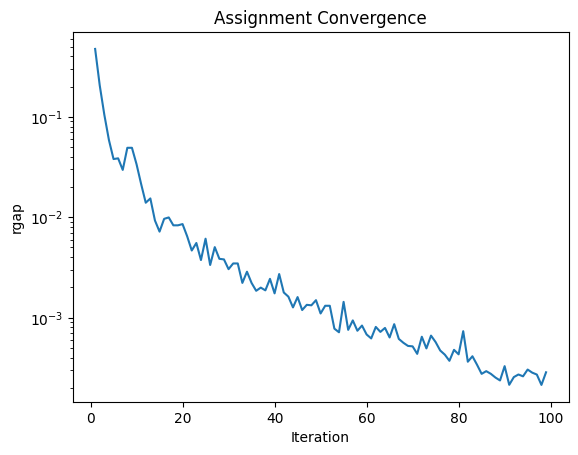

In [28]:
report = assig.report()
rgap = report.iloc[1:]["rgap"]
ax = rgap.plot(kind="line", logy=True)
ax.set_xlabel("Iteration")
ax.set_ylabel("rgap")
ax.set_title("Assignment Convergence")

In [17]:
results = assig.results().reset_index()
df = links.merge(results, on="link_id", how="left").query("link_type!='centroid_connector'")

df = df[["link_id", "link_type","geometry", "PCE_tot", "VOC_max"]].query('PCE_tot>0')
df = gpd.GeoDataFrame(df, geometry="geometry")

In [18]:
results.head(10)

,link_id,matrix_ab,matrix_ba,matrix_tot,Preload_AB,Preload_BA,Preload_tot,Congested_Time_AB,Congested_Time_BA,Congested_Time_Max,Delay_factor_AB,Delay_factor_BA,Delay_factor_Max,VOC_AB,VOC_BA,VOC_max,PCE_AB,PCE_BA,PCE_tot
0,1,1066.601,0.0,1066.601,0.0,0.0,0.0,0.423756,0.0,0.423756,1.295889,0.0,1.295889,1.185112,0.0,1.185112,1066.601,0.0,1066.601
1,2,0.000,0.0,0.000,0.0,0.0,0.0,0.173000,0.0,0.173000,1.000000,0.0,1.000000,0.000000,0.0,0.000000,0.000,0.0,0.000
2,3,1636.744,0.0,1636.744,0.0,0.0,0.0,0.347053,0.0,0.347053,1.735264,0.0,1.735264,1.487949,0.0,1.487949,1636.744,0.0,1636.744
3,4,921.785,0.0,921.785,0.0,0.0,0.0,0.161842,0.0,0.161842,1.264393,0.0,1.264393,1.152231,0.0,1.152231,921.785,0.0,921.785
4,5,529.317,0.0,529.317,0.0,0.0,0.0,0.175916,0.0,0.175916,1.028747,0.0,1.028747,0.661646,0.0,0.661646,529.317,0.0,529.317
5,6,776.247,0.0,776.247,0.0,0.0,0.0,0.261714,0.0,0.261714,1.132963,0.0,1.132963,0.970309,0.0,0.970309,776.247,0.0,776.247
6,7,120.834,0.0,120.834,0.0,0.0,0.0,0.480037,0.0,0.480037,1.000078,0.0,1.000078,0.151043,0.0,0.151043,120.834,0.0,120.834
7,8,69.555,0.0,69.555,0.0,0.0,0.0,0.440012,0.0,0.440012,1.000027,0.0,1.000027,0.115925,0.0,0.115925,69.555,0.0,69.555
8,9,49.798,0.0,49.798,0.0,0.0,0.0,0.338002,0.0,0.338002,1.000007,0.0,1.000007,0.082997,0.0,0.082997,49.798,0.0,49.798
9,10,2446.419,0.0,2446.419,0.0,0.0,0.0,0.314834,0.0,0.314834,1.819851,0.0,1.819851,1.529012,0.0,1.529012,2446.419,0.0,2446.419


In [32]:
df.PCE_tot=df.PCE_tot.round(2)
df.VOC_max=df.VOC_max.round(2)

In [36]:
import pandas as pd
import geopandas as gpd

field_for_thickness = "PCE_tot"
field_for_color = "VOC_max"
max_thickness = 25
n_bins = 6

df["line_weight"] = max_thickness * (df[field_for_thickness] / df[field_for_thickness].max())

bins = pd.interval_range(start=0, end=max_thickness, periods=n_bins, closed="right")
weight_bin = pd.cut(df["line_weight"], bins=bins, include_lowest=True)

m = None
for b in bins:
    subset = df.loc[weight_bin == b, ["link_id", field_for_thickness, field_for_color, "line_weight", "geometry"]].copy()
    if subset.empty:
        continue
    subset = gpd.GeoDataFrame(subset, geometry="geometry")
    width = float((b.left + b.right) / 2)
    m = subset.explore(
        column=field_for_color,
        cmap="RdYlGn_r",
        legend=(m is None),
        tooltip=["link_id", field_for_thickness, field_for_color],
        style_kwds={"weight": width, "opacity": 0.8},
        tiles="CartoDB positron",  # grayscale basemap
        m=m,
    )

m

In [ ]:
assig.save_results("tutorial")